In [ ]:
# Impor library yang dibutuhkan
import pandas as pd
import numpy as np
import ast
import pickle
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

In [24]:
# Memasukkan data csv untuk diolah
df = pd.read_csv('(10022025) final_perfume_data.csv')

In [25]:
# Contoh 5 data teratas dari tabel
df.head()

,variant,brand,notes,image url
0,Tihota Eau de Parfum,Indult,"[{""id"": 1, ""nama"": ""vanilla bean""}, {""id"": 2, ...",https://static.luckyscent.com/images/products/...
1,Sola Parfum,Di Ser,"[{""id"": 3, ""nama"": ""lavender""}, {""id"": 4, ""nam...",https://static.luckyscent.com/images/products/...
2,Kagiroi Parfum,Di Ser,"[{""id"": 11, ""nama"": ""green yuzu""}, {""id"": 12, ...",https://static.luckyscent.com/images/products/...
3,Velvet Fantasy Eau de Parfum,Montale,"[{""id"": 23, ""nama"": ""tangerine""}, {""id"": 24, ""...",https://static.luckyscent.com/images/products/...
4,A Blvd. Called Sunset Eau de Parfum,A Lab on Fire,"[{""id"": 35, ""nama"": ""bergamot""}, {""id"": 36, ""n...",https://static.luckyscent.com/images/products/...


In [26]:
df.dtypes

variant      object
brand        object
notes        object
image url    object
dtype: object

In [27]:
def safe_convert(obj):
    if pd.isna(obj):  # Check if the object is NaN
        return []   # Return an empty list if it's NaN
    L = []
    for i in ast.literal_eval(obj):
        L.append(i['nama'])
    return L

# Apply the safe_convert function to the 'notes' column
df['notes'] = df['notes'].apply(safe_convert)

In [28]:
# Hasil Tabel setelah dilakukan perubahan
df.head()

,variant,brand,notes,image url
0,Tihota Eau de Parfum,Indult,"[vanilla bean, musk]",https://static.luckyscent.com/images/products/...
1,Sola Parfum,Di Ser,"[lavender, yuzu, lemongrass, magnolia, geraniu...",https://static.luckyscent.com/images/products/...
2,Kagiroi Parfum,Di Ser,"[green yuzu, green shikuwasa, sansho seed, cor...",https://static.luckyscent.com/images/products/...
3,Velvet Fantasy Eau de Parfum,Montale,"[tangerine, pink pepper, black coffee, leather...",https://static.luckyscent.com/images/products/...
4,A Blvd. Called Sunset Eau de Parfum,A Lab on Fire,"[bergamot, almond, violet, jasmine, leather, s...",https://static.luckyscent.com/images/products/...


In [29]:
# Mengubah kolom notes menjadi string dengan menghapus semua koma (,)
df['notes'] = df['notes'].apply(lambda x: " ".join(x))

In [30]:
# Hasil tabel setelah dilakukan perubahan
df.head()

,variant,brand,notes,image url
0,Tihota Eau de Parfum,Indult,vanilla bean musk,https://static.luckyscent.com/images/products/...
1,Sola Parfum,Di Ser,lavender yuzu lemongrass magnolia geranium jas...,https://static.luckyscent.com/images/products/...
2,Kagiroi Parfum,Di Ser,green yuzu green shikuwasa sansho seed coriand...,https://static.luckyscent.com/images/products/...
3,Velvet Fantasy Eau de Parfum,Montale,tangerine pink pepper black coffee leather vio...,https://static.luckyscent.com/images/products/...
4,A Blvd. Called Sunset Eau de Parfum,A Lab on Fire,bergamot almond violet jasmine leather sandalw...,https://static.luckyscent.com/images/products/...


In [31]:
# Menggunakan CountVectorizer
cv = CountVectorizer(max_features=5000, stop_words='english')

In [32]:
# Mengubah kolom "notes" menjadi array
vectors = cv.fit_transform(df['notes']).toarray()

In [33]:
# Hasil kolom tags dalam bentuk array
vectors

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(2191, 1779))

In [34]:
# Menghitung cosine similarity untuk mendapatkan rekomendasi
similarity = cosine_similarity(vectors)

In [35]:
# Menghitung cosine similarity untuk mendapatkan rekomendasi
similarity = cosine_similarity(vectors)

# Hasil cosine similarity
similarity

array([[1.        , 0.        , 0.        , ..., 0.36514837, 0.11785113,
        0.12598816],
       [0.        , 1.        , 0.07905694, ..., 0.1118034 , 0.        ,
        0.        ],
       [0.        , 0.07905694, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.36514837, 0.1118034 , 0.        , ..., 1.        , 0.06454972,
        0.06900656],
       [0.11785113, 0.        , 0.        , ..., 0.06454972, 1.        ,
        0.04454354],
       [0.12598816, 0.        , 0.        , ..., 0.06900656, 0.04454354,
        1.        ]], shape=(2191, 2191))

> i want to know more about the score of cosine similarity

Cosine similarity is a measure of similarity between two non-zero vectors of an inner product space. It is defined as the cosine of the angle between the two vectors, which is also the dot product of the vectors divided by the product of their magnitudes. The cosine similarity score ranges from -1 to 1, where:

- 1 indicates that the two vectors are identical.
- 0 indicates that the two vectors are orthogonal (i.e., they have no similarity).
- -1 indicates that the two vectors are diametrically opposed.

In the context of recommendation systems, cosine similarity is often used to measure the similarity between items or users based on their attributes or preferences. A higher cosine similarity score between two items indicates that they are more similar to each other.

Let's take a closer look at the cosine similarity scores we have calculated. I'll display a portion of the similarity matrix to give you an idea of the scores.

In [36]:
# Display a portion of the similarity matrix to understand the cosine similarity scores
np.set_printoptions(threshold=np.inf)
similarity[:1000, :1000]

array([[1.        , 0.        , 0.        , 0.27216553, 0.20412415,
        0.33333333, 0.10910895, 0.        , 0.11111111, 0.12038585,
        0.25819889, 0.        , 0.28867513, 0.        , 0.        ,
        0.19245009, 0.        , 0.        , 0.        , 0.2981424 ,
        0.14433757, 0.57735027, 0.        , 0.20412415, 0.        ,
        0.        , 0.        , 0.        , 0.36514837, 0.14433757,
        0.20412415, 0.        , 0.        , 0.        , 0.        ,
        0.16666667, 0.14433757, 0.11547005, 0.09901475, 0.        ,
        0.        , 0.17407766, 0.        , 0.        , 0.20412415,
        0.        , 0.1490712 , 0.17407766, 0.        , 0.18257419,
        0.        , 0.17407766, 0.16666667, 0.15430335, 0.17407766,
        0.17407766, 0.15430335, 0.        , 0.39735971, 0.        ,
        0.11785113, 0.        , 0.4330127 , 0.10369517, 0.25819889,
        0.12309149, 0.        , 0.        , 0.27216553, 0.28867513,
        0.23570226, 0.12909944, 0.27216553, 0.  

> Make the result become heatmap and table version

In [37]:
# Add this before your heatmap code
from sklearn.metrics.pairwise import cosine_similarity

# Example: features is your item-feature matrix (NumPy array or pandas DataFrame)
# similarity = cosine_similarity(features)

# For demonstration, let's create a dummy similarity matrix
import numpy as np
similarity = np.random.rand(100, 100)  # Replace with your actual similarity calculation

Note: you may need to restart the kernel to use updated packages.


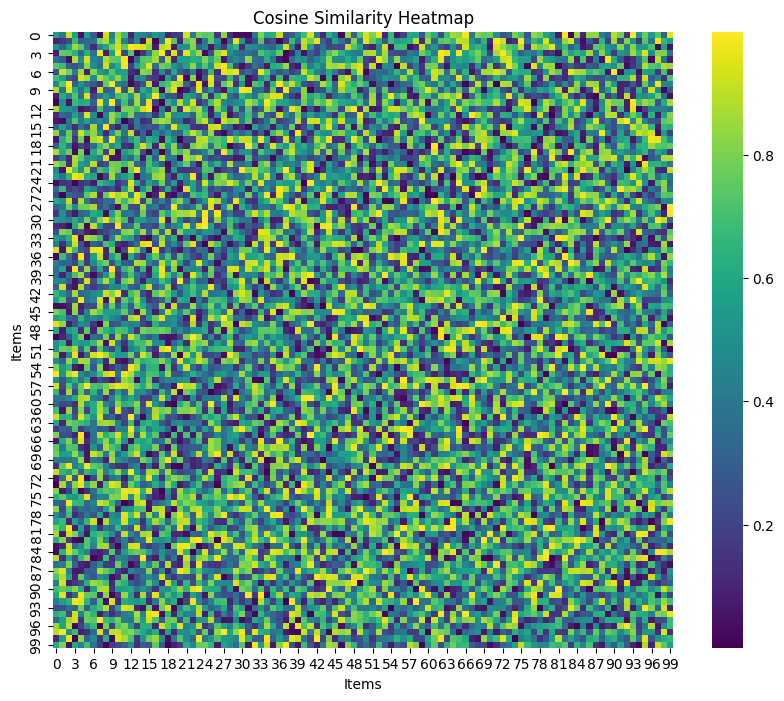

In [38]:
%pip install seaborn

import seaborn as sns
import matplotlib.pyplot as plt

# Make sure previous cells defining 'similarity' have been run

# Create a heatmap for the similarity matrix
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(similarity, cmap='viridis')

# Set title and labels
plt.title('Cosine Similarity Heatmap')
plt.xlabel('Items')
plt.ylabel('Items')

# Save the heatmap as an image file (replace 'cosine_heatmap.png' with your desired filename)
heatmap.get_figure().savefig('cosine_heatmap.png', dpi=1200)

# Optional: Display the heatmap before saving (optional, comment out if not needed)
plt.show()

In [39]:
import pandas as pd

# Make the table show full scores
pd.set_option('display.float_format', lambda x: '%.6f' % x)
# Display the similarity matrix as a table
similarity_df = pd.DataFrame(similarity)
similarity_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.561941,0.400755,0.920041,0.554924,0.038120,0.554341,0.289813,0.030633,0.923866,0.428702,...,0.896822,0.778445,0.148073,0.996972,0.524993,0.771910,0.540486,0.725975,0.302288,0.957897
1,0.085848,0.150615,0.215544,0.667989,0.293195,0.347147,0.371557,0.793754,0.876098,0.527267,...,0.849005,0.212696,0.811134,0.516879,0.148759,0.730621,0.381164,0.969461,0.667429,0.554222
2,0.502052,0.321474,0.558246,0.853244,0.748191,0.380084,0.122944,0.445011,0.579103,0.791014,...,0.459033,0.820501,0.419895,0.818816,0.526500,0.543989,0.704997,0.027105,0.556146,0.047343
3,0.074437,0.756250,0.739767,0.639127,0.330195,0.632392,0.368599,0.965685,0.069899,0.567062,...,0.156352,0.534455,0.477089,0.856885,0.667808,0.946589,0.481034,0.804233,0.796497,0.360962
4,0.351296,0.286720,0.036885,0.881293,0.477399,0.935130,0.441034,0.394912,0.885447,0.761725,...,0.618185,0.286090,0.072166,0.137383,0.359096,0.723702,0.018043,0.893939,0.366660,0.076580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.330844,0.573340,0.856883,0.929790,0.158706,0.780588,0.745223,0.987624,0.679921,0.641472,...,0.613653,0.626375,0.047062,0.680255,0.224426,0.623372,0.081569,0.217706,0.223343,0.672605
96,0.846612,0.587838,0.895276,0.026101,0.198842,0.489740,0.665797,0.004967,0.790813,0.188325,...,0.072733,0.865625,0.991102,0.763781,0.173626,0.413906,0.871951,0.059385,0.477431,0.683951
97,0.894496,0.998793,0.489902,0.676918,0.088997,0.124852,0.339910,0.937354,0.265336,0.902052,...,0.703135,0.438393,0.640056,0.826782,0.197805,0.526066,0.537959,0.125204,0.943340,0.127537
98,0.117113,0.539701,0.966628,0.003574,0.833395,0.331266,0.471643,0.145171,0.625307,0.024934,...,0.635848,0.373907,0.266451,0.746491,0.391971,0.959642,0.255387,0.531048,0.609818,0.656169


In [44]:
def recommend_by_notes(notes_keyword):
    # Cari parfum yang mengandung notes_keyword pada kolom 'notes'
    matches = df[df['notes'].str.contains(notes_keyword, case=False, na=False)]
    if matches.empty:
        print(f"Tidak ditemukan parfum dengan notes '{notes_keyword}'.")
        return

    # Ambil index parfum pertama yang cocok
    idx = matches.index[0]
    print(f"Parfum dengan notes '{notes_keyword}' ditemukan: {df.loc[idx, 'variant']}")

    # Hitung similarity dan ambil 5 teratas (selain dirinya sendiri)
    distances = sorted(list(enumerate(similarity[idx])), reverse=True, key=lambda x: x[1])
    print("\n5 Rekomendasi parfum paling mirip:")
    for i in distances[1:6]:
        variant = df.loc[i[0], 'variant']
        print(f"{variant} - Similarity: {i[1]:.4f}")

# Contoh penggunaan:
recommend_by_notes('almond')

Parfum dengan notes 'almond' ditemukan: A Blvd. Called Sunset Eau de Parfum

5 Rekomendasi parfum paling mirip:
Homa Parfum - Similarity: 0.9807
Undergrowth Eau de Parfum - Similarity: 0.9696
Rouge Smoking Eau de Parfum - Similarity: 0.9654
Petits Papiers Eau de Parfum - Similarity: 0.9522
Freckled and Beautiful Eau de Parfum - Similarity: 0.9351


This code defines a function `recommend` to find and display perfume recommendations based on the similarity of their 'notes'. It searches for rows in the DataFrame 'df' where the 'notes' column contains the specified keyword `notes_name`. It handles cases where no matches are found by printing a corresponding message and terminating. If matches are found, it selects one and computes the cosine similarity between that perfume and others using precomputed similarity scores from the `similarity` matrix. It then sorts these scores and prints the top 5 most similar perfumes, excluding the input perfume itself, along with their similarity scores. The function is tested with the keyword 'vanilla'.

In [ ]:
import pickle

pickle.dump(parfum,open('parfume.pkl','wb'))

In [ ]:
parfum['nama'].values

array(['African Orange Flower', 'Agarwood', 'Aldehyde', 'Almond',
       'Ambergris', 'Amber', 'Amberwood', 'Ambrette'], dtype=object)

In [ ]:
pickle.dump(parfum.to_dict(),open('parfume_dict.pkl','wb'))

In [ ]:
pickle.dump(similarity,open('similarity.pkl','wb'))